<a href="https://colab.research.google.com/github/a01137646/ComputerVision/blob/main/2_image_enhancement.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 2. Image Enhancement

## Table of Contents
1. [Libraries](#libraries)
2. [Histogram Equalization](#hist)
3. [Denoising with Filters](#denoising)
4. [Challenge](#challenge)

## Importing Libraries <a class="anchor" id="libraries" ></a>

In [22]:
from PIL import Image, ImageOps
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.image as mpimg
from skimage import exposure
import skimage
from scipy.ndimage.filters import gaussian_filter as gauss
from scipy.ndimage.filters import median_filter as med
import cv2

import os

<ipython-input-22-90bbfb25e2db>:7: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  from scipy.ndimage.filters import gaussian_filter as gauss
<ipython-input-22-90bbfb25e2db>:8: DeprecationWarning: Please use `median_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  from scipy.ndimage.filters import median_filter as med


In [4]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


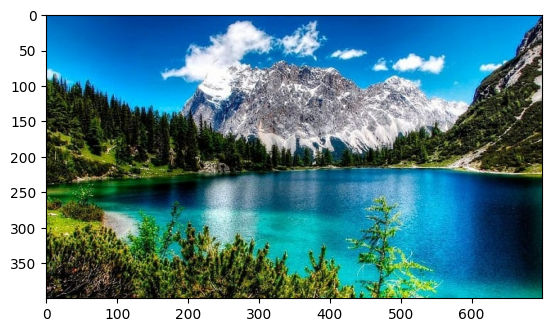

In [5]:
original_image = Image.open('drive/MyDrive/Vision/data/image.jpg')
plt.imshow(original_image)
type(original_image)

# Save the image
np.save('drive/MyDrive/Vision/data/img.npy', original_image)

#Load the image
original_image = np.load('drive/MyDrive/Vision/data/img.npy')

## Histogram Equalization<a class="anchor" id="hist" ></a>

Let's look at the distribution of pixel values in the image.

Ideally, the image should have relatively even distribution of values, indicating good contrast and making it easier to extract analytical information.

An easy way to check this is to plot a histogram.

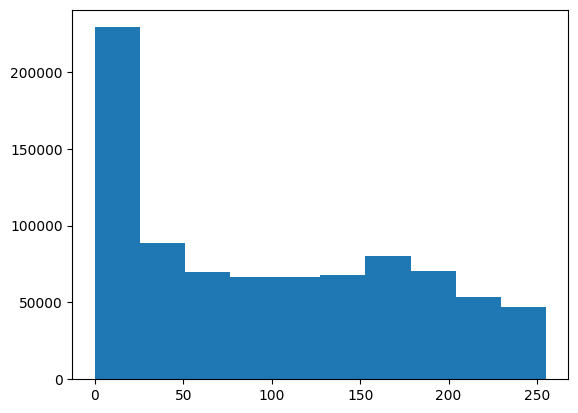

In [6]:
# Plot a histogram - we need to use ravel to "flatten" the 3 dimensions
plt.hist(original_image.ravel())
plt.show()

Another useful way to visualize the statistics of an image is as a cumulative distribution function (CDF) plot. Which shows the cumulative pixel intensity frequencies from 0 to 255.

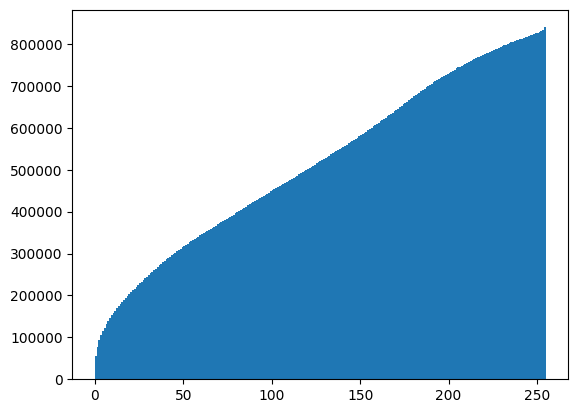

In [7]:
plt.hist(original_image.ravel(), bins=255, cumulative=True)
plt.show()

The histogram and CDF for our image show pretty uneven distribution - there's a lot of contrast in the image. Ideally we should equalize the values in the images we want to analyse to try to make our images more consistent in terms of the shapes they contain irrespective of light levels.

Histogram equalization is often used to improve the statistics of images. In simple terms, the histogram equalization algorithm attempts to adjust the pixel values in the image to create a more uniform distribution. The code in the cell below uses the  **exposure.equalize_hist** method from the **skimage** package to equalize the image.  

/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: This might be a color image. The histogram will be computed on the flattened image. You can instead apply this function to each color channel, or set channel_axis.
  return func(*args, **kwargs)


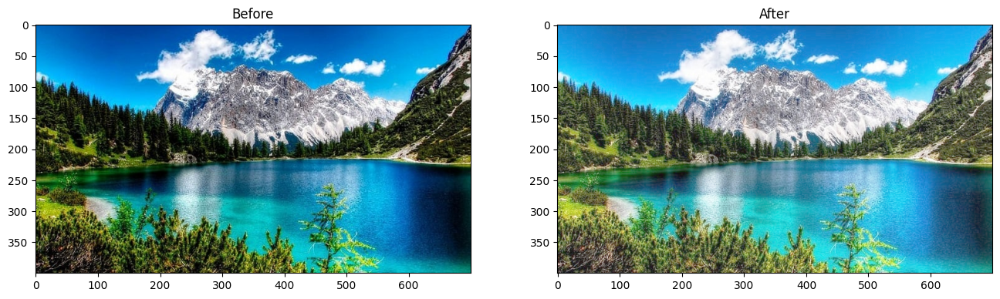

In [8]:
original_image_eq = exposure.equalize_hist(original_image)

fig = plt.figure(figsize=(16, 8))

# Subplot for original image
a=fig.add_subplot(1,2,1)
imgplot = plt.imshow(original_image)
a.set_title('Before')

# Subplot for processed image
a=fig.add_subplot(1,2,2)
imgplot = plt.imshow(original_image_eq)
a.set_title('After')

plt.show()

As with most image operations, there's more than one way to do this. For example, you could also use the **PIL.ImgOps.equalize** method:

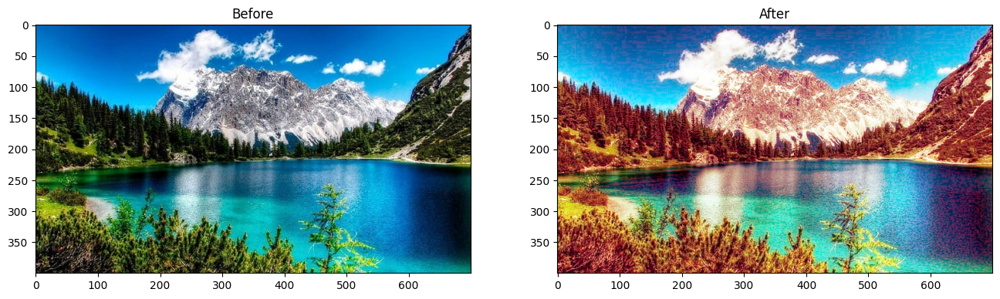

In [9]:

# Equalize the image - but we need to convert the numpy array back to the PIL image format
image_PIL_eq = ImageOps.equalize(Image.fromarray(original_image))

# Display using matplotlib

# Create a figure
fig = plt.figure(figsize=(16, 8))

# Subplot for original image
a=fig.add_subplot(1,2,1)
imgplot = plt.imshow(original_image)
a.set_title('Before')

# Subplot for processed image
a=fig.add_subplot(1,2,2)
imgplot = plt.imshow(image_PIL_eq)
a.set_title('After')

plt.show()

Now let's see what that's done to the histogram and CDF plots:

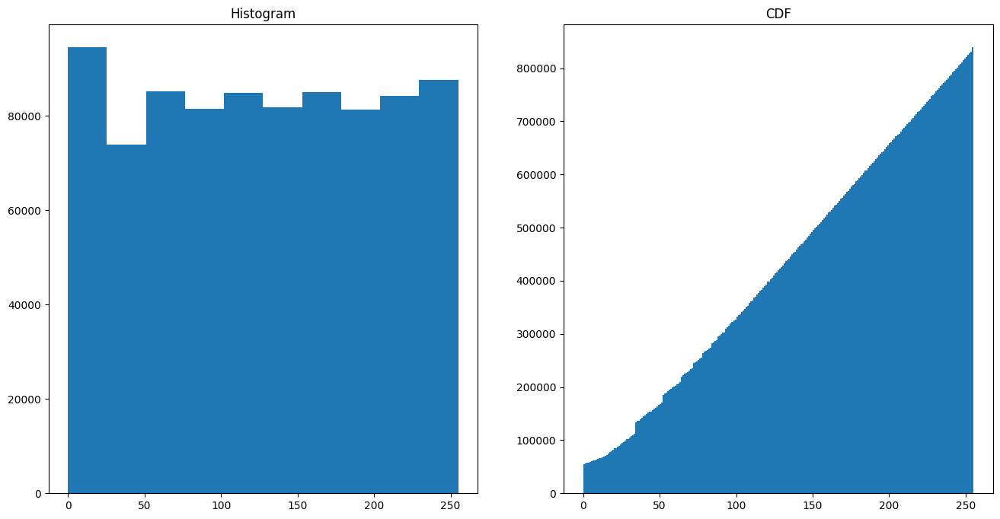

In [10]:
# Display histograms
img_eq = np.array(image_PIL_eq)

# Create a figure
fig = plt.figure(figsize=(16, 8))

# Subplot for original image
a=fig.add_subplot(1,2,1)
imgplot = plt.hist(img_eq.ravel())
a.set_title('Histogram')

# Subplot for processed image
a=fig.add_subplot(1,2,2)
imgplot = plt.hist(img_eq.ravel(), bins=255, cumulative=True)
a.set_title('CDF')

plt.show()

The pixel intensities are more evenly distributed in the equalized image. In particular, the cumulative density shows a straight diagonal cumulation; which is a good sign that the pixel intensity values have been equalized.

## Denoising with Filters <a class="anchor" id="denoising" ></a>

Often images need to be cleaned up to remove "salt and pepper" noise.

### Add Some Random Noise
Let's add some random noise to our image - such as you might see in a photograph taken in low light or at a low resolution.

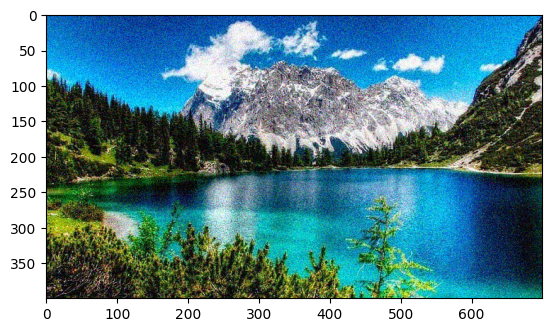

In [11]:
img_n = skimage.util.random_noise(original_image)
plt.imshow(img_n)

### Using a Gaussian Filter
A Gaussian filter applies a weighted average (mean) value for pixels based on the pixels that surround them.

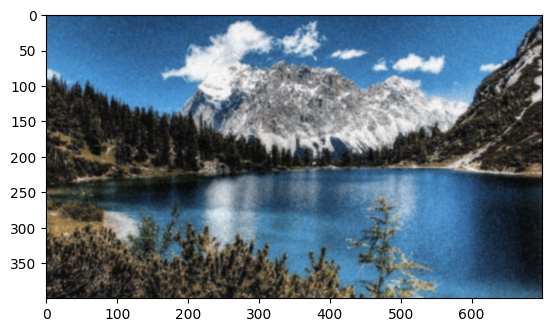

In [12]:
img3_gauss = gauss(img_n, sigma=1)
plt.imshow(img3_gauss)

### Using a Median Filter
The Gaussian filter results in a blurred image, which may actually be better for feature extraction as it makes it easier to find contrasting areas. If it's too blurred, we could try a median filter, which as the name suggests applies the median value to pixels based on the pixels around them.

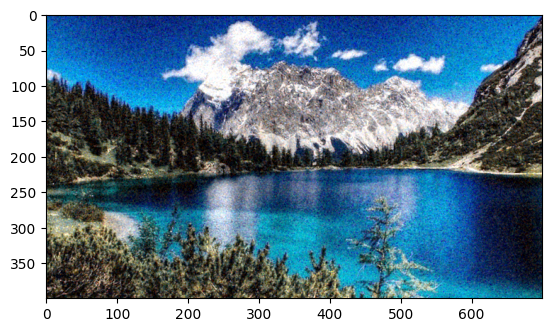

In [13]:
img_med = med(img_n, size=2)
plt.imshow(img_med)

## Challenge <a class="anchor" id="challenge" ></a>

Now, try solving this challenge, you must equalize different windows of the same image in a splitted way.

In [14]:
#!pip install image_slicer

In [140]:
from image_slicer import slice

n = 4
slice('drive/MyDrive/Vision/data/image.jpg', n)

(<Tile #1 - image_01_01.png>,
 <Tile #2 - image_01_02.png>,
 <Tile #3 - image_02_01.png>,
 <Tile #4 - image_02_02.png>)

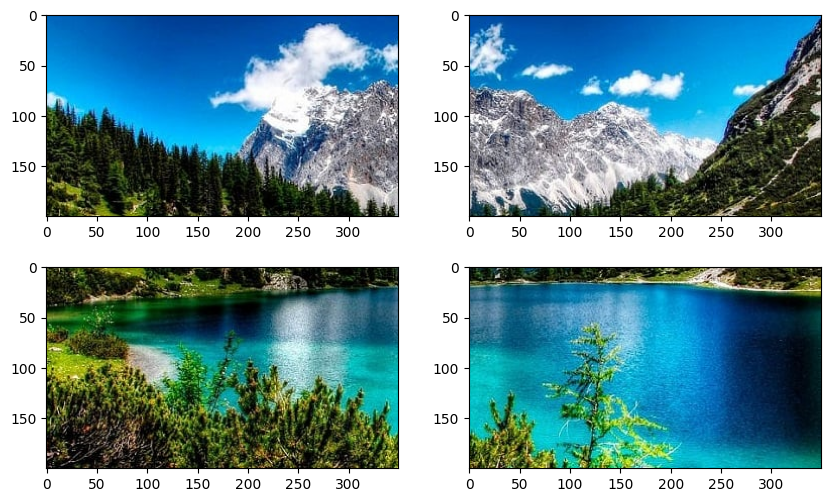

In [141]:
fig = plt.figure(figsize=(10, 6))

plt.subplot(2,2,1)
img = Image.open(f'drive/MyDrive/Vision/data/image_01_01.png')
plt.imshow(img)

plt.subplot(2,2,2)
img = Image.open(f'drive/MyDrive/Vision/data/image_01_02.png')
plt.imshow(img)

plt.subplot(2,2,3)
img = Image.open(f'drive/MyDrive/Vision/data/image_02_01.png')
plt.imshow(img)

plt.subplot(2,2,4)
img = Image.open(f'drive/MyDrive/Vision/data/image_02_02.png')
plt.imshow(img)

plt.show()

## 1. Investiga e implementa el método tile-based histogram equalization. En estos métodos, la imagen se particiona en diferentes ventanas (i.e. mosaicos) y los histogramas se calculan de forma independiente, aplicando la corrección sobre cada ventana. Existe un compromiso entre el tamaño de la ventana y la complejidad computacional, por lo cual es más complejo que el método simple. Implementa esta versión y realiza algunas pruebas variando el tamaño de la ventana. Otro inconveniente es que se puede observar posibles diferencias entre los el contraste de los bloques, ¿cómo podría mejorarse?

Generamos una función para dividir la imagen en un NxN imágenes, donde se le aplica el método de ecualización a cada corte de la imagen individualmente, y luego las concatenamos para desplegar como 1 sola imagen.

In [71]:
def crop_image_equalized(input_path, output_folder, n):
    # Open the image
    img = Image.open(input_path)

    # Get the dimensions of the original image
    width, height = img.size

    # Calculate the dimensions of each cropped image
    crop_width = width // n
    crop_height = height // n

    # Create output folder if it doesn't exist
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)


    # Create a list to store the images
    images = []
    # Crop and save each smaller image
    for i in range(n):
        # Create a list to store each row of the images
        row_images = []
        for j in range(n):
            # Define the limits in pixels of each cropped image
            left = j * crop_width
            upper = i * crop_height
            right = left + crop_width
            lower = upper + crop_height

            # Crop the image
            cropped_img = img.crop((left, upper, right, lower))

            # Save the cropped image
            output_path = os.path.join(output_folder, f"crop_{i}_{j}.jpg")
            cropped_img.save(output_path)

            # Equalize the cropped image
            original_image_eq = exposure.equalize_hist(np.array(cropped_img))
            # Add it to the list of each row
            row_images.append(original_image_eq)
        # Add each row of images to the list with all images
        images.append(row_images)

    # Concatenate images
    joined_image = np.concatenate([np.concatenate(row_images, axis=1) for row_images in images], axis=0)

    # Create a figure and plot the joined image
    fig, ax = plt.subplots(figsize=(10, 6))
    ax.axis('off')  # Hide axes
    ax.imshow(joined_image)

    plt.show()

Aplicamos el método:

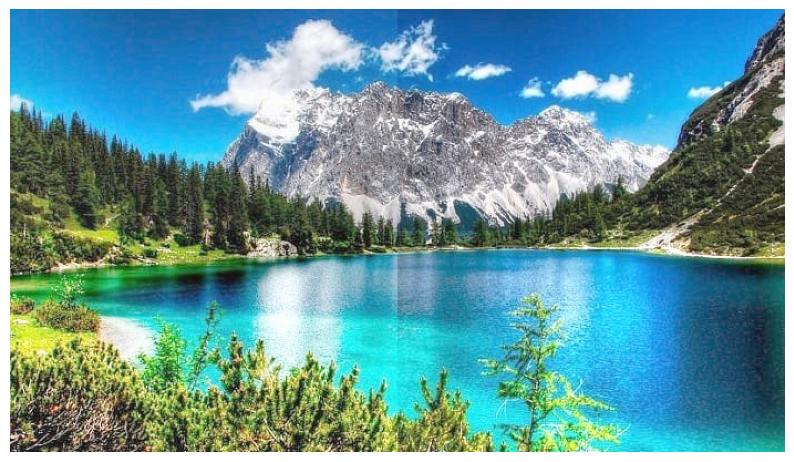

In [144]:
input_image_path = 'drive/MyDrive/Vision/data/image.jpg'
output_folder_path = 'drive/MyDrive/Vision/data/crop'
num_crops = 2

crop_image_equalized(input_image_path, output_folder_path, num_crops)

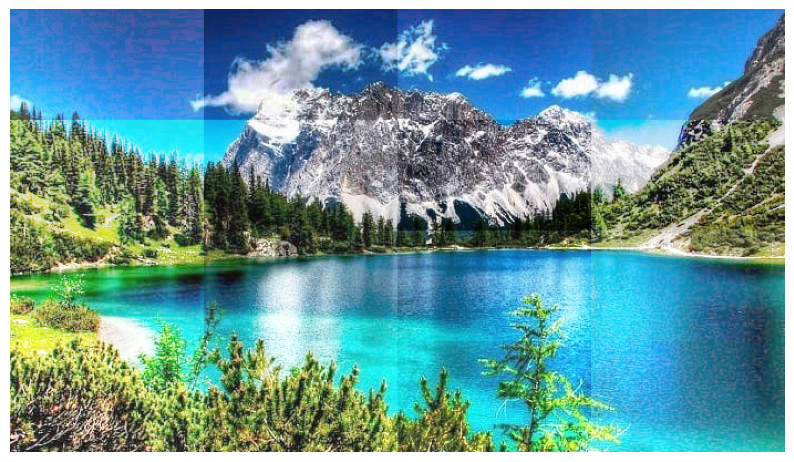

In [145]:
num_crops = 4

crop_image_equalized(input_image_path, output_folder_path, num_crops)

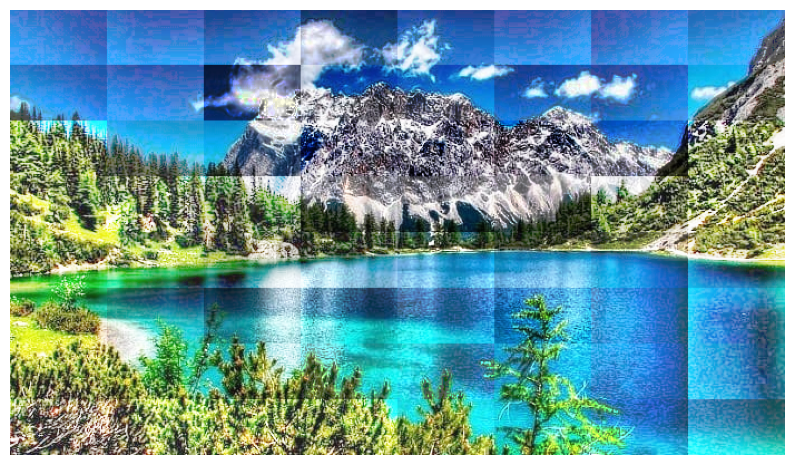

In [146]:
num_crops = 8

crop_image_equalized(input_image_path, output_folder_path, num_crops)

Ahora utilizamos openCV para hacer lo mismo, pero definiendo ventanas con el tamaño de los pixeles de cada una.

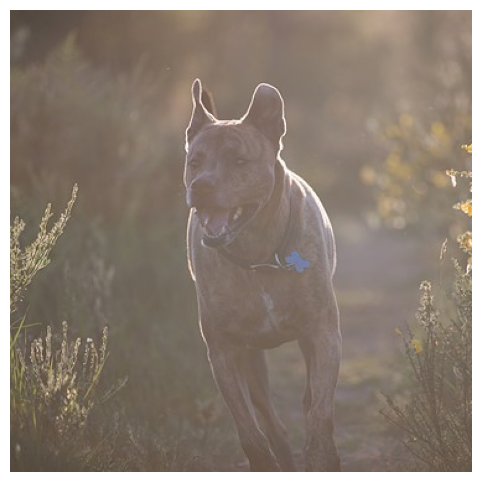

In [153]:
# Read the color image
image = cv2.imread('drive/MyDrive/Vision/data/hist.jpg')

# Display the original and result images
plt.figure(figsize=(10, 6))

plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.show()

In [155]:
def tile_histogram_equalization(image, tile_size):
    # Convert image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Get image dimensions
    height, width = gray.shape

    # Create an output image with the same shape as the input
    output_image = np.zeros_like(gray, dtype=np.uint8)

    # Apply histogram equalization to each tile
    for y in range(0, height, tile_size):
        for x in range(0, width, tile_size):
            tile = gray[y:y+tile_size, x:x+tile_size]

            # Apply histogram equalization to the tile
            equalized_tile = cv2.equalizeHist(tile)

            # Place the equalized tile back into the output image
            output_image[y:y+tile_size, x:x+tile_size] = equalized_tile

    return output_image

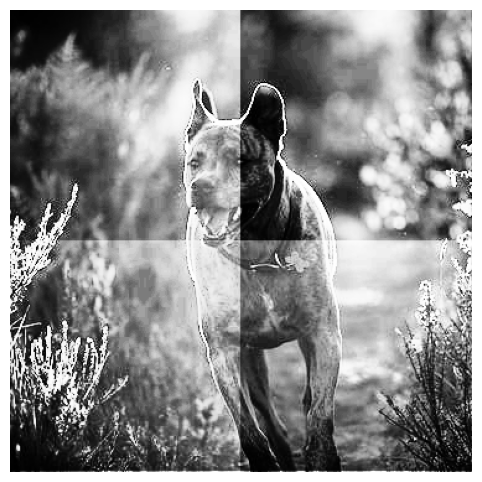

In [156]:
# Read the color image
image = cv2.imread('drive/MyDrive/Vision/data/hist.jpg')

# Set the tile size (adjust as needed)
tile_size = image.shape[0]//2

# Apply tile-based histogram equalization to the color image
result_image = tile_histogram_equalization(image, tile_size)

# Display the original and result images
plt.figure(figsize=(10, 6))

plt.imshow(cv2.cvtColor(result_image, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.show()

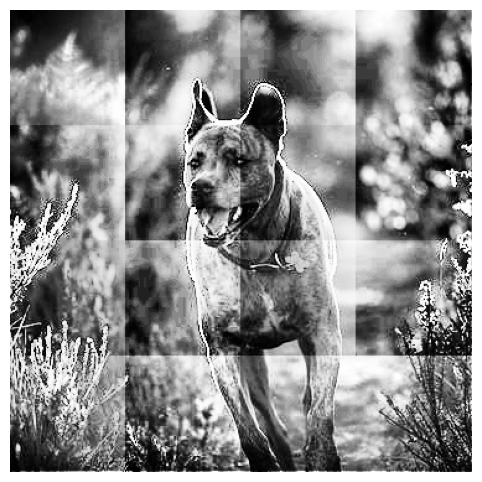

In [157]:
# Set the tile size (adjust as needed)
tile_size = image.shape[0]//4

# Apply tile-based histogram equalization to the color image
result_image = tile_histogram_equalization(image, tile_size)

# Display the original and result images
plt.figure(figsize=(10, 6))

plt.imshow(cv2.cvtColor(result_image, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.show()

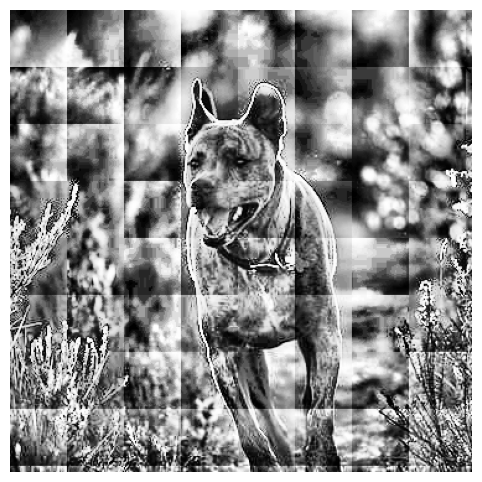

In [158]:
# Set the tile size (adjust as needed)
tile_size = image.shape[0]//8

# Apply tile-based histogram equalization to the color image
result_image = tile_histogram_equalization(image, tile_size)

# Display the original and result images
plt.figure(figsize=(10, 6))

plt.imshow(cv2.cvtColor(result_image, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.show()

Como es posible observar, entre mayor sea el número de ventanas para la imagen, más apreciación al detalle de cada ventana se obtiene. Sin embargo, si el número de ventanas es muy grande, esto puede generar ruido al ecualizar individualmente cada ventana. Se debe buscar una relación entre la imagen y la cantidad de ventanas.

## 2. Investiga e implementa un método sencillo del Sliding Window Adaptive Histogram Equalization (SWAHE) y compara algunas imágenes con diferentes tipos de imágenes.

In [110]:
def swahe(image, tile_size):
    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Get image dimensions
    height, width = gray.shape

    # Create an output image with the same shape as the input
    output_image = np.zeros_like(gray, dtype=np.uint8)

    # Apply SWAHE to each tile using a sliding window
    for y in range(0, height - tile_size + 1, tile_size):
        for x in range(0, width - tile_size + 1, tile_size):
            tile = gray[y:y+tile_size, x:x+tile_size]

            # Apply histogram equalization to the tile
            equalized_tile = cv2.equalizeHist(tile)

            # Place the equalized tile back into the output image
            output_image[y:y+tile_size, x:x+tile_size] = equalized_tile

    return output_image

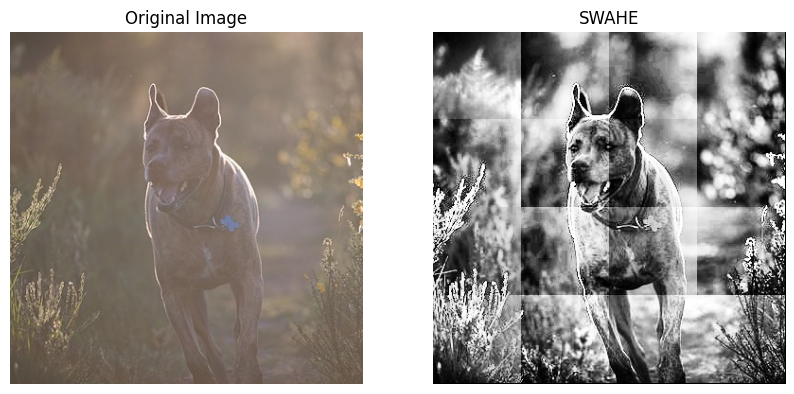

In [136]:
# Read the color image
image = cv2.imread('drive/MyDrive/Vision/data/hist.jpg')

# Set the tile size (adjust as needed)
tile_size = image.shape[0]//4

# Apply SWAHE to the color image
result_image = swahe(image, tile_size)

# Display the original and result images
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('SWAHE')
plt.imshow(result_image, cmap='gray')
plt.axis('off')

plt.show()

## 3. Investiga cómo funciona el algoritmo CLAHE (contrast limited adaptive histogram equalization) y realiza una implementación (puede ser usando la implementación de OpenCV). Prueba sobre diferentes tipos de imágenes y compara con el método de ecualización de histogramas básico. Provee una breve descripción del método a partir de una  investigación bibliográfica.

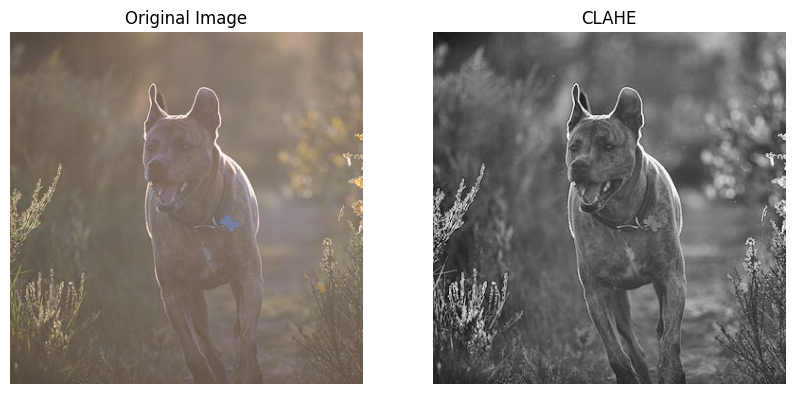

In [159]:
image = cv2.imread('drive/MyDrive/Vision/data/hist.jpg')

# Convert the image to grayscale
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Create a CLAHE object
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))

# Apply CLAHE to the grayscale image
clahe_image = clahe.apply(gray)

# Display the original and CLAHE-enhanced images
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('CLAHE')
plt.imshow(clahe_image, cmap='gray')
plt.axis('off')

plt.show()


Probemos ahora los métodos vistos previamente:

In [183]:
def five_methods(image_path):
  images = []

  image = cv2.imread(image_path)
  image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

  images.append(image)
  # Convert the image to grayscale
  gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
  images.append(exposure.equalize_hist(gray))
  # Set the tile size (adjust as needed)
  tile_size = image.shape[0]//4
  # Apply tile-based histogram equalization to the color image
  images.append(tile_histogram_equalization(image, tile_size))
  # Apply SWAHE
  images.append(swahe(image, tile_size))
  # Create a CLAHE object
  clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
  # Apply CLAHE to the grayscale image
  images.append(clahe.apply(gray))

  # Display the original and enhanced images
  plt.figure(figsize=(20, 5))

  methods = ['Original Image', 'Equalized', 'Tile Based Equalization', 'SWAHE', 'CLAHE']
  for i in range(len(methods)):
    plt.subplot(1, len(methods), i+1)
    plt.title(methods[i])
    plt.imshow(images[i], cmap='gray')
    plt.axis('off')

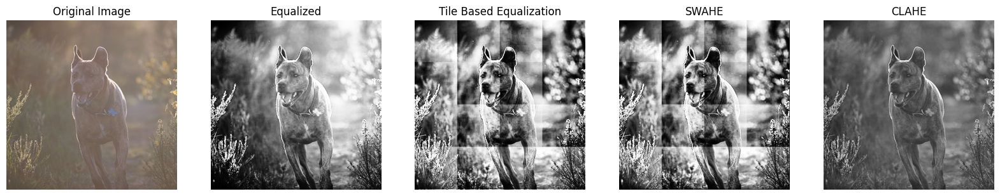

In [184]:
five_methods('drive/MyDrive/Vision/data/hist.jpg')

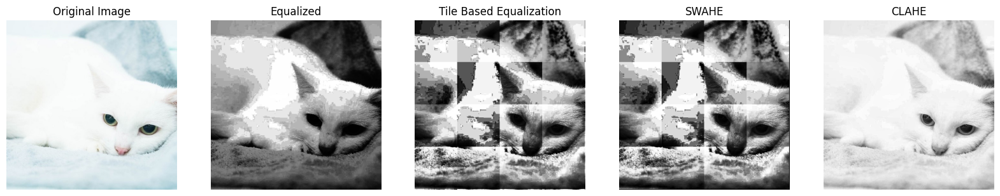

In [185]:
five_methods('drive/MyDrive/Vision/data/hist2.jpeg')

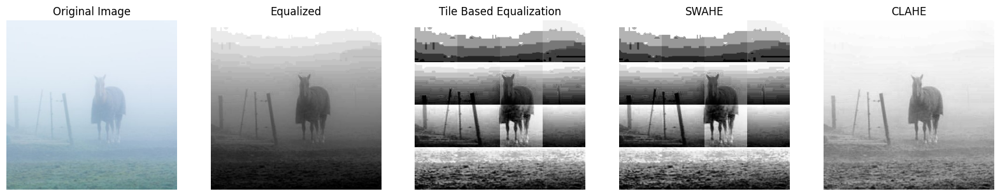

In [186]:
five_methods('drive/MyDrive/Vision/data/hist3.jpg')

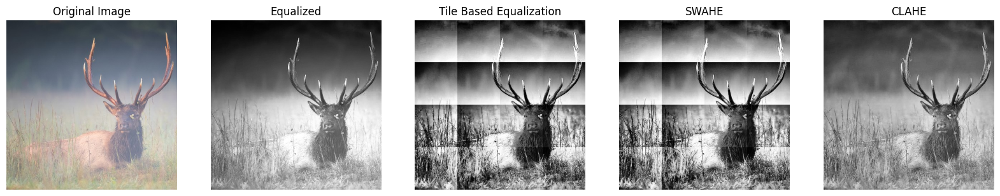

In [187]:
five_methods('drive/MyDrive/Vision/data/hist4.jpg')

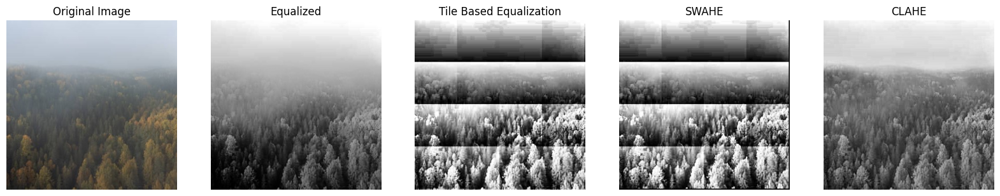

In [188]:
five_methods('drive/MyDrive/Vision/data/hist5.jpg')